# Stop Words

Los Stop Words son palabras que se utilizan comunmente en el armado de oraciones pero no proveen información por si mismas. Algunos ejemplos en español sería "de", "un", "la", "el" y "en".
Para evitar el almacenamientoy procesamiento extra que requieren estas palabras es común extraerlas. Para hacerlo es necesario tener acceso a una lista de aquellas palabras que se consideren stopwords en el idioma en el que estemos trabajando.

## Stop Words en inglés

In [1]:
from nltk.corpus import stopwords

# nltk.download('punkt')
print(stopwords.words("english"))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

## Stop Words en español

In [2]:
print(stopwords.words("spanish"))

['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestro', 'vuestra', 'vuestros', 'vuestras', 'esos', 'esas', 'estoy', 'estás', 'está', 'estamos', 'estáis', 'están', 'e

# Ejemplo

In [3]:
# nltk.download('punkt')
from nltk.tokenize import word_tokenize

example = "The Palace of Westminster serves as the meeting place for both the House of Commons and the House of Lords, the two houses of the Parliament of the United Kingdom. Informally known as the Houses of Parliament after its occupants, the Palace lies on the north bank of the River Thames in the City of Westminster, in central London, England."
# General lista de stop words
stop_words = set(stopwords.words("english"))

# Aplicar Tokenizer
tokenized_text = word_tokenize(example)
print(tokenized_text)

['The', 'Palace', 'of', 'Westminster', 'serves', 'as', 'the', 'meeting', 'place', 'for', 'both', 'the', 'House', 'of', 'Commons', 'and', 'the', 'House', 'of', 'Lords', ',', 'the', 'two', 'houses', 'of', 'the', 'Parliament', 'of', 'the', 'United', 'Kingdom', '.', 'Informally', 'known', 'as', 'the', 'Houses', 'of', 'Parliament', 'after', 'its', 'occupants', ',', 'the', 'Palace', 'lies', 'on', 'the', 'north', 'bank', 'of', 'the', 'River', 'Thames', 'in', 'the', 'City', 'of', 'Westminster', ',', 'in', 'central', 'London', ',', 'England', '.']


In [4]:
# Crear lista sin stopwords
example_no_stopwords = [x for x in tokenized_text if not x.lower() in stop_words]
print(example_no_stopwords)

['Palace', 'Westminster', 'serves', 'meeting', 'place', 'House', 'Commons', 'House', 'Lords', ',', 'two', 'houses', 'Parliament', 'United', 'Kingdom', '.', 'Informally', 'known', 'Houses', 'Parliament', 'occupants', ',', 'Palace', 'lies', 'north', 'bank', 'River', 'Thames', 'City', 'Westminster', ',', 'central', 'London', ',', 'England', '.']


In [5]:
import requests
import os
from dotenv import load_dotenv
import pandas as pd
import string
from nltk.tokenize import TweetTokenizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

url = "https://api.twitter.com/2/tweets/search/recent"
# Cargar valores del archivo .env en las variables de entorno
load_dotenv()
# Cargar valor del token a variable
bearer_token = os.environ.get("BEARER_TOKEN")

# Ejercicio

- Obtener de la API una lista de Tweets que no sean retweet y que contengan el hashtag #football en inglés.
- Realizar la tokenización y limpieza
- Crear una nube de palabras

In [6]:
params = {
    'query': '#football lang:en -is:retweet',
    'tweet.fields': 'created_at',
    'max_results': 100
}
headers = {
    "Authorization": f"Bearer {bearer_token}",
    "User-Agent": "v2FullArchiveSearchPython"
}
response = requests.get(url, headers=headers, params=params)
print(response)
# Generar excepción si la respuesta no es exitosa
if response.status_code != 200:
    raise Exception(response.status_code, response.text)
print(response.json())


<Response [200]>
{'data': [{'created_at': '2021-10-23T14:31:25.000Z', 'id': '1451919193213845514', 'text': '👉 $8.25 👈\nOuterstuff Kyrie Irving Brooklyn Nets 11 Youth Player Name Number Long Sleeve @topfanscorner \n#Outerstuff #Kyrie #Irving #Brooklyn #Nets  #Youth #Player #NFL #Football #NFLfans \n\nHurry up to get it for the best price!\nhttps://t.co/i7hnR4034p'}, {'created_at': '2021-10-23T14:31:12.000Z', 'id': '1451919136578285572', 'text': '⚽️ GOAL: Sandiacre Town 0-1 Aslockton &amp; Orston (NSL Cup)\nThe Saints have gone behind in this League Cup game.\n\n#Saints #erewashsport #football'}, {'created_at': '2021-10-23T14:31:07.000Z', 'id': '1451919115434745864', 'text': "Get Seen!  We'll Post Your Business Everyday!  Sign Up Today.\nhttps://t.co/qjw8zFx9Fo\n\n#nfl #nba #lilwayne #football #basketball #businessowner #beautyshop #marketing #lambomedia #insta #haircut #instalike #atlanta #tesla #jordan #dancing #beyonce #tennis #onlineshoppi"}, {'created_at': '2021-10-23T14:31:04.000Z'

In [7]:
df = pd.json_normalize(response.json()["data"])
df

,created_at,id,text
0,2021-10-23T14:31:25.000Z,1451919193213845514,👉 $8.25 👈\nOuterstuff Kyrie Irving Brooklyn Ne...
1,2021-10-23T14:31:12.000Z,1451919136578285572,⚽️ GOAL: Sandiacre Town 0-1 Aslockton &amp; Or...
2,2021-10-23T14:31:07.000Z,1451919115434745864,Get Seen! We'll Post Your Business Everyday! ...
3,2021-10-23T14:31:04.000Z,1451919102487015428,Ambolomadinika High school students- everyone ...
4,2021-10-23T14:30:38.000Z,1451918993854509056,Betting has never been better With Coral\nAvai...
...,...,...,...
95,2021-10-23T14:12:13.000Z,1451914361765699586,Matt Hasselbeck on his final year in Seattle w...
96,2021-10-23T14:12:12.000Z,1451914356073979907,"Why Tay Gowan, return in Zach Ertz trade, thou..."
97,2021-10-23T14:12:11.000Z,1451914350617260044,Steelers 6-week stock report for the offense h...
98,2021-10-23T14:12:09.000Z,1451914344975900684,Matt Hasselbeck shares story about the ball fr...


In [8]:
URL_REGEX = r"(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'\".,<>?«»“”‘’]))"
MENTIONS_REGEX = r"(?<=^|(?<=[^a-zA-Z0-9-_\.]))@([A-Za-z]+[A-Za-z0-9-_]+)"
HASHTAG_REGEX = r"#"


df["text"].replace(URL_REGEX, "", regex=True, inplace=True)
df["text"].replace(MENTIONS_REGEX, "", regex=True, inplace=True)
df["text"].replace(HASHTAG_REGEX, "", regex=True, inplace=True)
df["text"].replace(r"[^A-Za-z0-9 | \n]+", " ", regex=True, inplace=True)
df["text"].replace(r"\t", " ", regex=True, inplace=True)
df["text"].replace("[{}]".format(string.punctuation), " ", regex=True, inplace=True)
df["text"].replace(r"\n", "", regex=True, inplace=True)

df["text"] = df["text"].str.lower()
df

,created_at,id,text
0,2021-10-23T14:31:25.000Z,1451919193213845514,8 25 outerstuff kyrie irving brooklyn nets...
1,2021-10-23T14:31:12.000Z,1451919136578285572,goal sandiacre town 0 1 aslockton amp ors...
2,2021-10-23T14:31:07.000Z,1451919115434745864,get seen we ll post your business everyday ...
3,2021-10-23T14:31:04.000Z,1451919102487015428,ambolomadinika high school students everyone ...
4,2021-10-23T14:30:38.000Z,1451918993854509056,betting has never been better with coralavaila...
...,...,...,...
95,2021-10-23T14:12:13.000Z,1451914361765699586,matt hasselbeck on his final year in seattle w...
96,2021-10-23T14:12:12.000Z,1451914356073979907,why tay gowan return in zach ertz trade thou...
97,2021-10-23T14:12:11.000Z,1451914350617260044,steelers 6 week stock report for the offense ...
98,2021-10-23T14:12:09.000Z,1451914344975900684,matt hasselbeck shares story about the ball fr...


In [9]:
# Tokenizar

tt = TweetTokenizer()

tokenized_text = df["text"].apply(tt.tokenize)
df["tokenized_text"] = tokenized_text
df

,created_at,id,text,tokenized_text
0,2021-10-23T14:31:25.000Z,1451919193213845514,8 25 outerstuff kyrie irving brooklyn nets...,"[8, 25, outerstuff, kyrie, irving, brooklyn, n..."
1,2021-10-23T14:31:12.000Z,1451919136578285572,goal sandiacre town 0 1 aslockton amp ors...,"[goal, sandiacre, town, 0, 1, aslockton, amp, ..."
2,2021-10-23T14:31:07.000Z,1451919115434745864,get seen we ll post your business everyday ...,"[get, seen, we, ll, post, your, business, ever..."
3,2021-10-23T14:31:04.000Z,1451919102487015428,ambolomadinika high school students everyone ...,"[ambolomadinika, high, school, students, every..."
4,2021-10-23T14:30:38.000Z,1451918993854509056,betting has never been better with coralavaila...,"[betting, has, never, been, better, with, cora..."
...,...,...,...,...
95,2021-10-23T14:12:13.000Z,1451914361765699586,matt hasselbeck on his final year in seattle w...,"[matt, hasselbeck, on, his, final, year, in, s..."
96,2021-10-23T14:12:12.000Z,1451914356073979907,why tay gowan return in zach ertz trade thou...,"[why, tay, gowan, return, in, zach, ertz, trad..."
97,2021-10-23T14:12:11.000Z,1451914350617260044,steelers 6 week stock report for the offense ...,"[steelers, 6, week, stock, report, for, the, o..."
98,2021-10-23T14:12:09.000Z,1451914344975900684,matt hasselbeck shares story about the ball fr...,"[matt, hasselbeck, shares, story, about, the, ..."


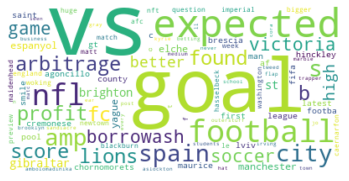

In [10]:
# Generar nube de palabras
wordcloud = WordCloud(
    max_words=100, background_color="white", collocations=False
).generate(df["tokenized_text"].to_string())

# Mostrar gráfico
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.rcParams["figure.figsize"] = [150, 150]
plt.show()

- Eliminar las stopwords
- Generar una nueva nube de palabras

In [11]:
from nltk.corpus import stopwords

stopwords = set(stopwords.words("english"))
no_stopwords_data = []
# Crear lista sin stopwords
for x in tokenized_text:
    for word in x:
        if word.lower() not in stop_words:
            no_stopwords_data.append(word)
print(no_stopwords_data)

['8', '25', 'outerstuff', 'kyrie', 'irving', 'brooklyn', 'nets', '11', 'youth', 'player', 'name', 'number', 'long', 'sleeve', 'outerstuff', 'kyrie', 'irving', 'brooklyn', 'nets', 'youth', 'player', 'nfl', 'football', 'nflfans', 'hurry', 'get', 'best', 'price', 'goal', 'sandiacre', 'town', '0', '1', 'aslockton', 'amp', 'orston', 'nsl', 'cup', 'saints', 'gone', 'behind', 'league', 'cup', 'game', 'saints', 'erewashsport', 'football', 'get', 'seen', 'post', 'business', 'everyday', 'sign', 'today', 'nfl', 'nba', 'lilwayne', 'football', 'basketball', 'businessowner', 'beautyshop', 'marketing', 'lambomedia', 'insta', 'haircut', 'instalike', 'atlanta', 'tesla', 'jordan', 'dancing', 'beyonce', 'tennis', 'onlineshoppi', 'ambolomadinika', 'high', 'school', 'students', 'everyone', 'turned', 'team', 'photo', 'thanks', 'carryduff', 'colts', 'donating', 'jerseys', 'madagascar', 'football', 'teamwork', 'gratitude', 'thankyou', 'betting', 'never', 'better', 'coralavailable', 'sport', 'market', '1', 'ne

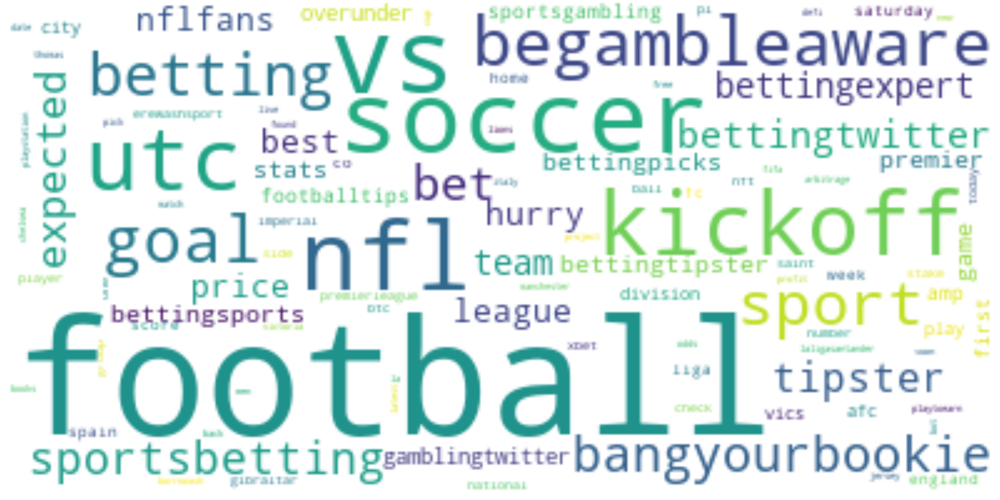

In [12]:
# Generar nube de palabras
# " ".join(map(str,test_list))
data = " ".join(map(str, no_stopwords_data))
wordcloud = WordCloud(
    max_words=100, background_color="white", collocations=False
).generate(data)

# Mostrar gráfico
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.rcParams["figure.figsize"] = [150, 150]
plt.show()

- ¿Cómo ha cambiado el gráfico?
- ¿Ha cambiado el significado?

# ¿ Cómo ha cambiado el gráfico?

#### El nuevo gráfico tiene solo palabras claves relacionadas al #football solicitado. Se han eliminado las stop Words por lo que este gráfico es más representativo. Además el nuevo gráfico no está tan cargado visualmente hablando.
# ¿Ha cambiado el significado?

#### Si, ha cambiado el significado dado que el nuevo gráfico es más representativo en función del tema seleccionado en el hashtag.